In [30]:
import pandas as pd
import time

In [31]:
start=time.perf_counter()

In [32]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [33]:
from FPLPredictor import FPLPredictor

In [34]:
#add this info to a settings dict?
stats_current_gameweek = 11
picks_current_gameweek = 11
current_season = 20252026

In [35]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146764 entries, 0 to 146763
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 328.1+ MB


In [36]:
df[(df['season']==current_season)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131904,Bukayo Saka,1.0,3.0,Man Utd
131905,Bukayo Saka,2.0,6.0,Leeds
131906,Bukayo Saka,3.0,0.0,Liverpool
131907,Bukayo Saka,4.0,0.0,Nott'm Forest
131684,Bukayo Saka,5.0,1.0,Man City
131687,Bukayo Saka,6.0,2.0,Newcastle
131908,Bukayo Saka,7.0,8.0,West Ham
131909,Bukayo Saka,8.0,7.0,Fulham
131911,Bukayo Saka,9.0,3.0,Crystal Palace
131912,Bukayo Saka,10.0,3.0,Burnley


In [37]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [38]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7364/13826

Training Set Performance:
R² Score: 0.8031
RMSE: 16.2275
MAE: 11.7462

Test Set Performance:
R² Score: 0.5072
RMSE: 26.0221
MAE: 18.4821

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.458763
                          minutes_elo_adj_running_avg_prev_3    0.183169
                                     bps_running_avg_prev_10    0.008262
                                 minutes_running_avg_prev_10    0.007141
                                                opp_team_elo    0.007017
                            opp_team_elo_running_avg_prev_10    0.006704
                    goals_scored_elo_adj_running_avg_prev_10    0.006685
                             opp_team_elo_running_avg_prev_3    0.005963
                                                    elo_diff    0.005522
                             opp_team_elo_running_avg_prev_5    0.005141
          

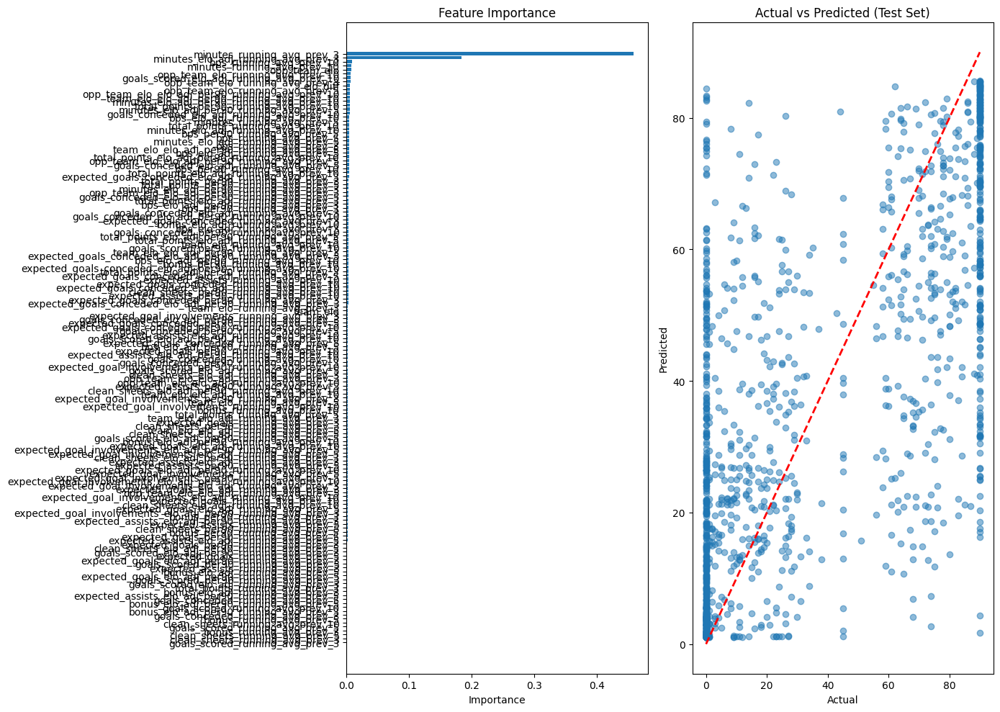

Cleaned df size: 28444/49821

Training Set Performance:
R² Score: 0.6818
RMSE: 21.6591
MAE: 15.8871

Test Set Performance:
R² Score: 0.5468
RMSE: 25.8005
MAE: 18.5936

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.739188
                          minutes_elo_adj_running_avg_prev_3    0.013505
                                     bps_running_avg_prev_10    0.008030
                                 minutes_running_avg_prev_10    0.007550
                          minutes_elo_adj_running_avg_prev_5    0.007137
                                  minutes_running_avg_prev_5    0.005549
                            opp_team_elo_running_avg_prev_10    0.004429
                                                opp_team_elo    0.004211
                             opp_team_elo_running_avg_prev_5    0.003825
                                                    elo_diff    0.003766
         

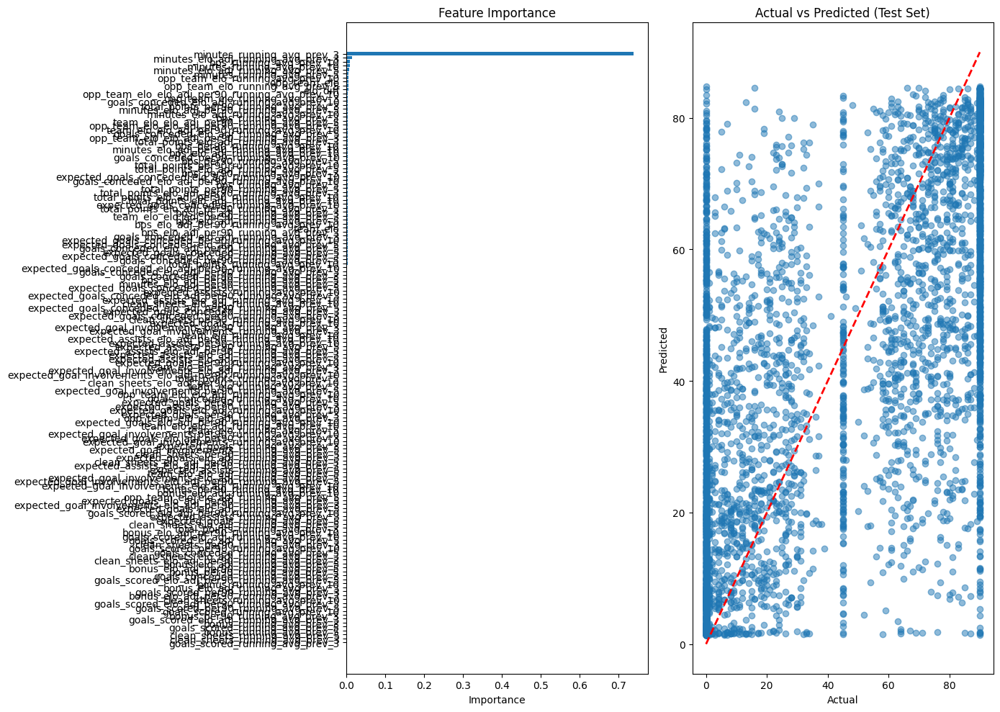

Cleaned df size: 21562/39035

Training Set Performance:
R² Score: 0.6565
RMSE: 24.7367
MAE: 18.2413

Test Set Performance:
R² Score: 0.4876
RMSE: 30.2314
MAE: 22.3860

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.700977
                          minutes_elo_adj_running_avg_prev_3    0.015125
                            opp_team_elo_running_avg_prev_10    0.007609
                                                opp_team_elo    0.006995
                                 minutes_running_avg_prev_10    0.006809
                             opp_team_elo_running_avg_prev_3    0.006637
                             opp_team_elo_running_avg_prev_5    0.006039
                                                    elo_diff    0.006031
                                  minutes_running_avg_prev_5    0.005516
                         minutes_elo_adj_running_avg_prev_10    0.004831
         

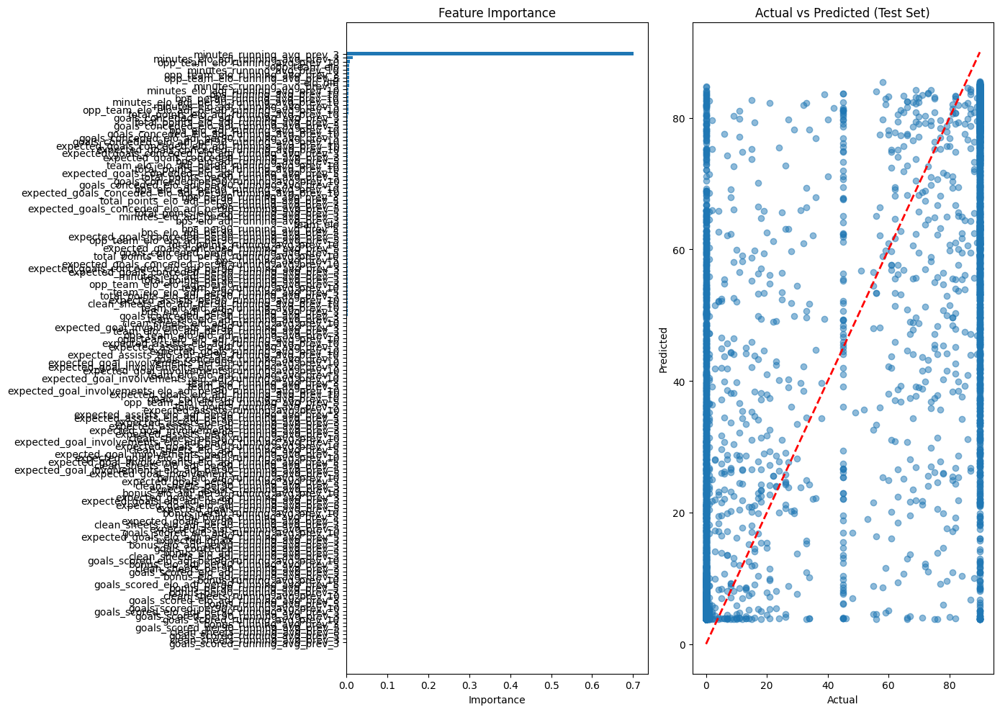

Cleaned df size: 4616/8287

Training Set Performance:
R² Score: 0.8365
RMSE: 18.0862
MAE: 10.0984

Test Set Performance:
R² Score: 0.6859
RMSE: 25.0542
MAE: 14.8084

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.411310
                             total_points_running_avg_prev_3    0.146258
                     total_points_elo_adj_running_avg_prev_3    0.114269
                       total_points_per90_running_avg_prev_3    0.042814
                          minutes_elo_adj_running_avg_prev_3    0.018118
                            opp_team_elo_running_avg_prev_10    0.010989
                                bps_per90_running_avg_prev_3    0.010971
                                                opp_team_elo    0.009874
                             opp_team_elo_running_avg_prev_3    0.007416
                                                    elo_diff    0.007190
           

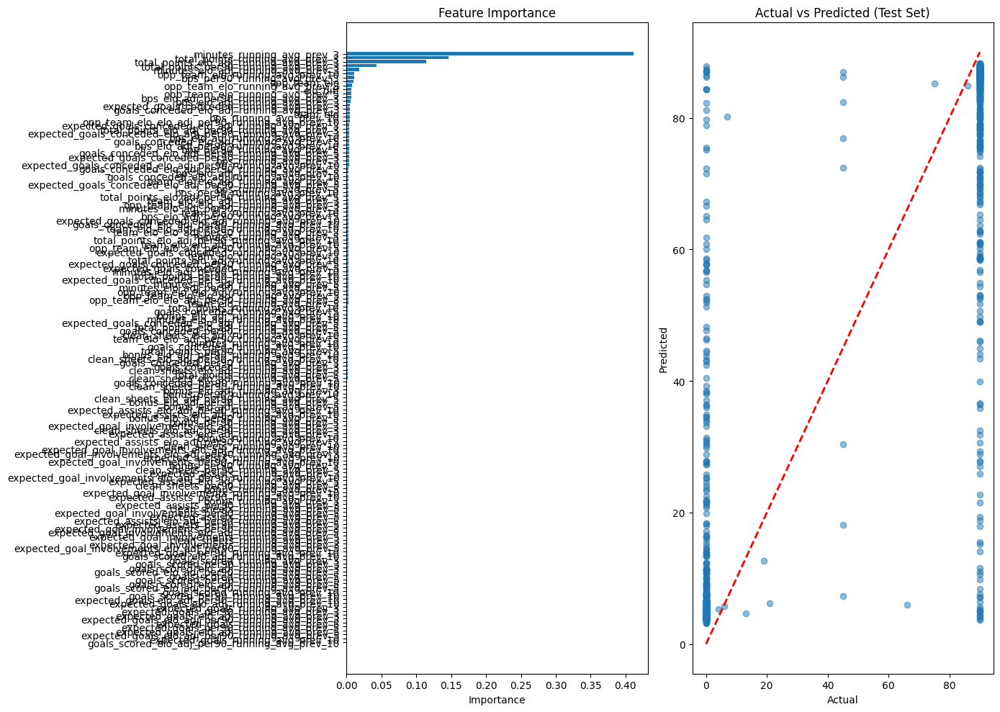

In [39]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2369/4088

Training Set Performance:
R² Score: 0.6304
RMSE: 0.2751
MAE: 0.2095

Test Set Performance:
R² Score: 0.1358
RMSE: 0.4169
MAE: 0.3056

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.048302
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.039808
                                                opp_team_elo    0.024270
        expected_goal_involvements_per90_running_avg_prev_10    0.018355
          expected_assists_elo_adj_per90_running_avg_prev_10    0.016110
            expected_goals_elo_adj_per90_running_avg_prev_10    0.015682
         expected_goal_involvements_per90_running_avg_prev_3    0.013685
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.013203
    expected_goals_conceded_elo_adj_per90_running_avg_prev_3    0.013067
         expected_goal_involvements_per90_

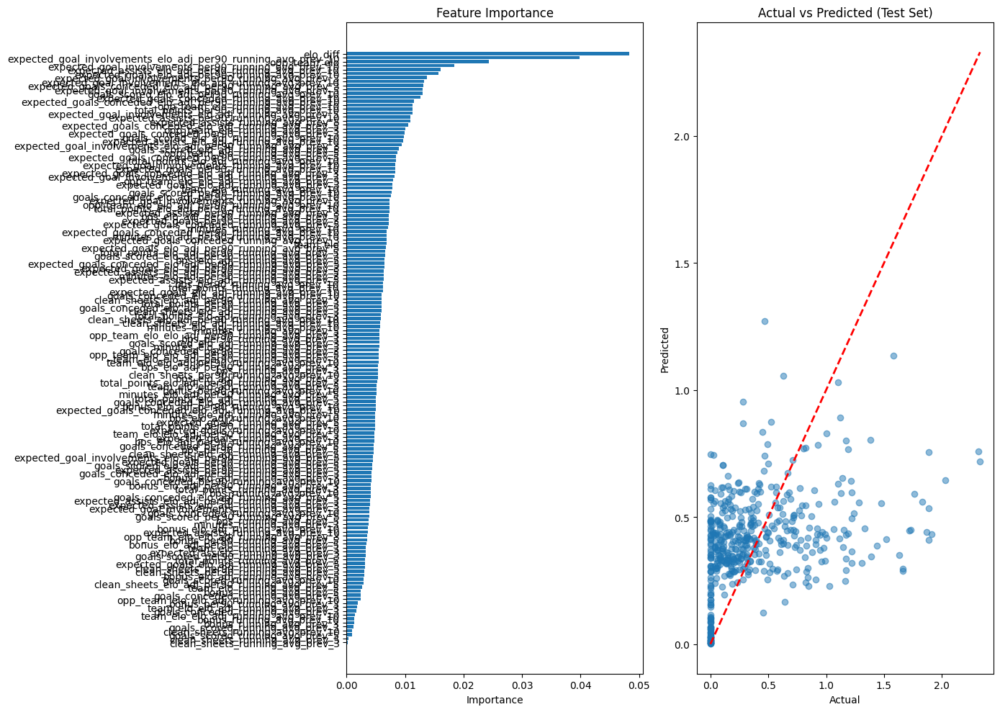

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10621/16922

Training Set Performance:
R² Score: 0.5511
RMSE: 0.1696
MAE: 0.1120

Test Set Performance:
R² Score: 0.1263
RMSE: 0.2414
MAE: 0.1469

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.138019
                    expected_goals_per90_running_avg_prev_10    0.063425
                                                opp_team_elo    0.046126
                  expected_goals_elo_adj_running_avg_prev_10    0.041021
                             opp_team_elo_running_avg_prev_5    0.024150
                                                    elo_diff    0.019685
            expected_goals_elo_adj_per90_running_avg_prev_10    0.018696
                             opp_team_elo_running_avg_prev_3    0.013865
                            opp_team_elo_running_avg_prev_10    0.013453
              expected_goal_involvements

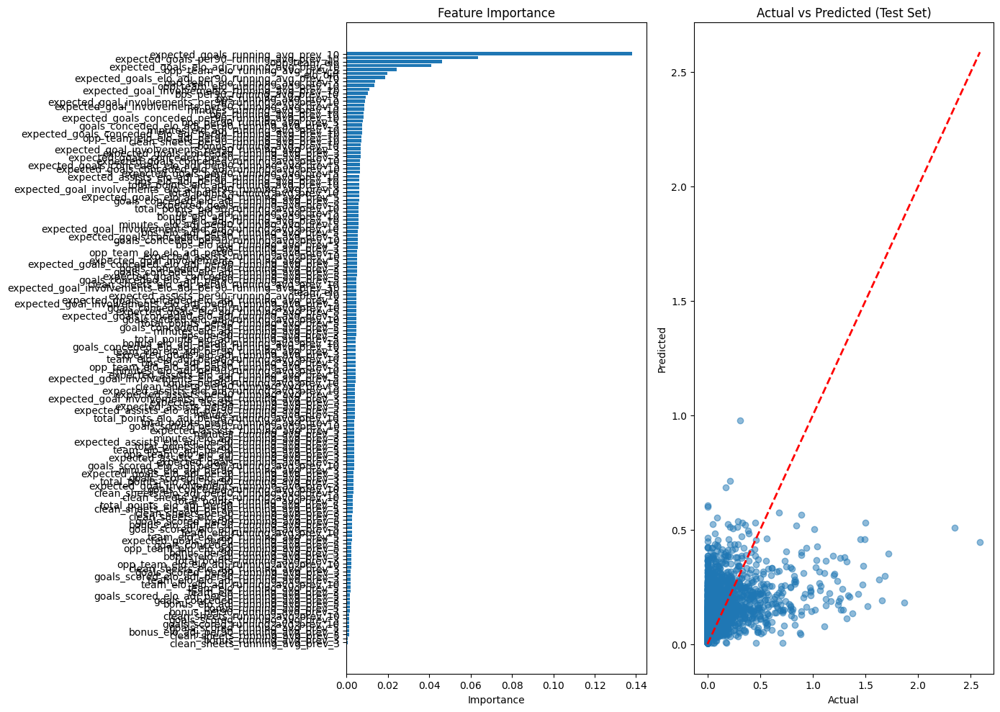

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 9122/14918

Training Set Performance:
R² Score: 0.3324
RMSE: 0.0922
MAE: 0.0535

Test Set Performance:
R² Score: -0.0063
RMSE: 0.1270
MAE: 0.0661

Feature Importance:
                                                     feature  importance
                  expected_goals_elo_adj_running_avg_prev_10    0.035518
                                                opp_team_elo    0.028952
                  expected_goals_conceded_running_avg_prev_3    0.027266
            expected_goals_elo_adj_per90_running_avg_prev_10    0.025537
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.023776
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.022030
                             bps_elo_adj_running_avg_prev_10    0.019528
                              bps_elo_adj_running_avg_prev_3    0.019522
            expected_goals_conceded_per90_running_avg_prev_5    0.018289
                 expected_goals_conceded

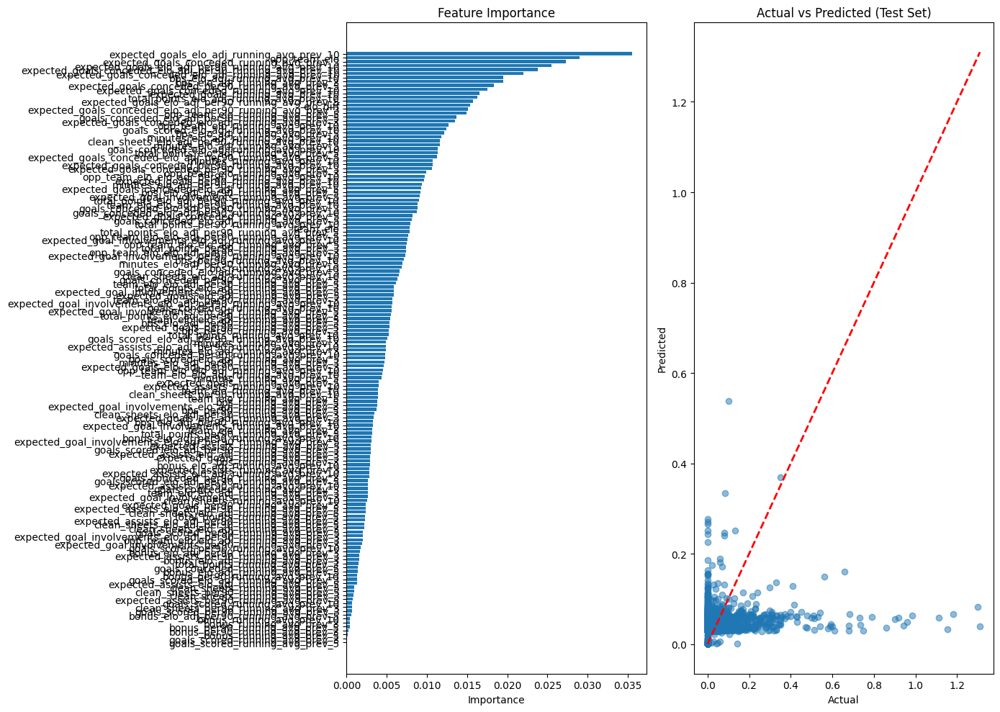

In [40]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2369/4088

Training Set Performance:
R² Score: 0.6187
RMSE: 0.0780
MAE: 0.0514

Test Set Performance:
R² Score: 0.0325
RMSE: 0.1167
MAE: 0.0761

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.076020
          expected_assists_elo_adj_per90_running_avg_prev_10    0.037193
                                                opp_team_elo    0.034962
                 expected_assists_elo_adj_running_avg_prev_3    0.033601
                        expected_assists_running_avg_prev_10    0.026629
                  expected_assists_per90_running_avg_prev_10    0.020244
                             opp_team_elo_running_avg_prev_3    0.019110
           expected_assists_elo_adj_per90_running_avg_prev_5    0.018932
                             opp_team_elo_running_avg_prev_5    0.017917
 expected_goal_involvements_elo_adj_per9

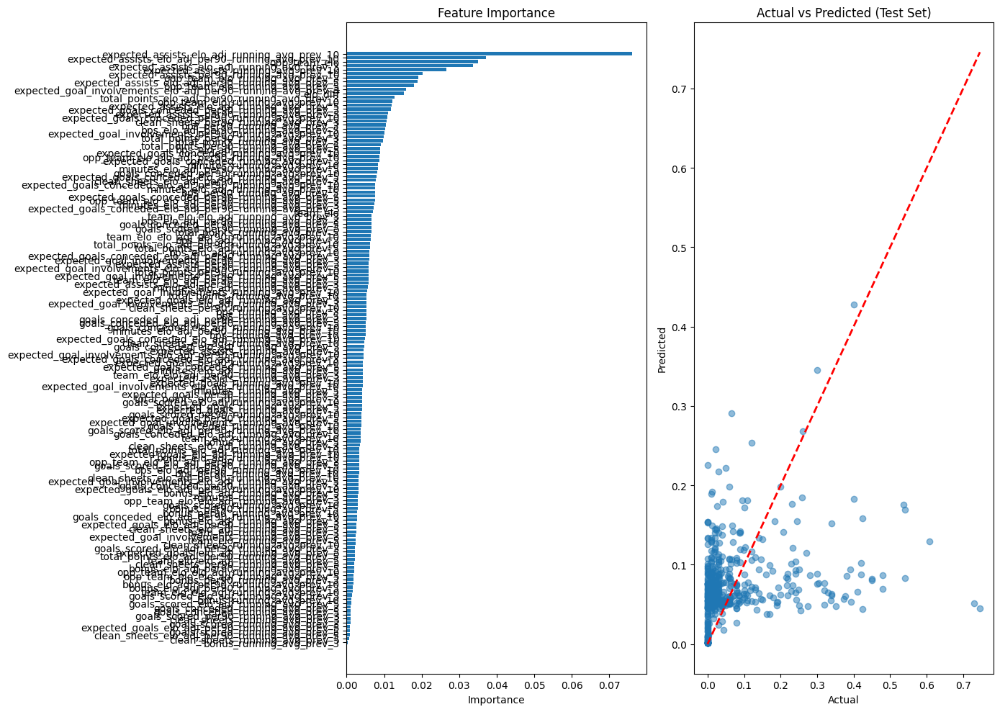

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10621/16922

Training Set Performance:
R² Score: 0.4742
RMSE: 0.1189
MAE: 0.0808

Test Set Performance:
R² Score: 0.1515
RMSE: 0.1472
MAE: 0.0963

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.115915
          expected_assists_elo_adj_per90_running_avg_prev_10    0.109578
                                                opp_team_elo    0.037426
                                                    elo_diff    0.031956
                  expected_assists_per90_running_avg_prev_10    0.031396
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.025578
                        expected_assists_running_avg_prev_10    0.018820
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.016887
                             opp_team_elo_running_avg_prev_5    0.013272
           expected_assists_elo_adj_pe

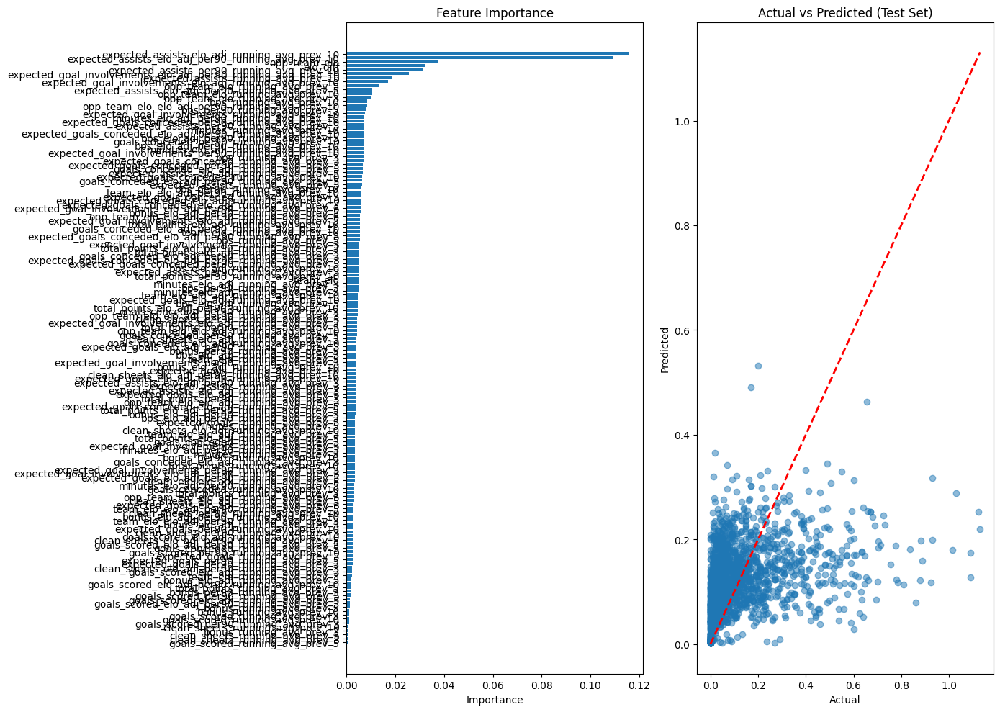

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 9122/14918

Training Set Performance:
R² Score: 0.4841
RMSE: 0.0756
MAE: 0.0442

Test Set Performance:
R² Score: 0.0881
RMSE: 0.0947
MAE: 0.0530

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.099866
                expected_assists_elo_adj_running_avg_prev_10    0.066878
                  expected_assists_per90_running_avg_prev_10    0.061062
                                                opp_team_elo    0.043655
                        expected_assists_running_avg_prev_10    0.020235
                             opp_team_elo_running_avg_prev_3    0.018932
                                                    elo_diff    0.016818
                                                    team_elo    0.016346
                 expected_assists_elo_adj_running_avg_prev_5    0.015440
           expected_assists_elo_adj_per

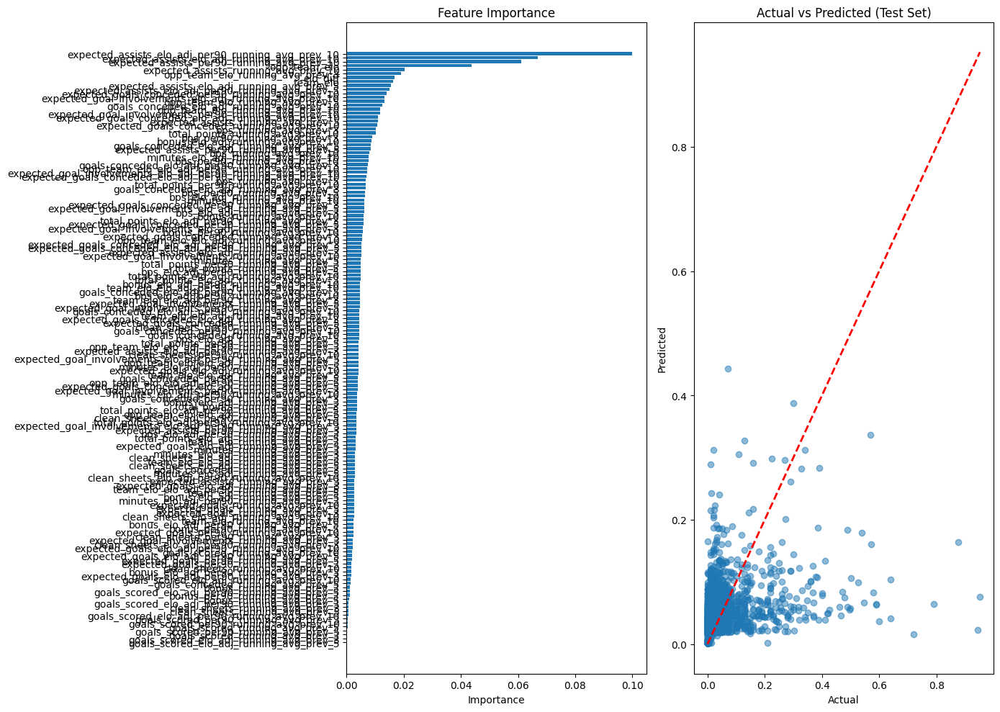

In [41]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2369/4088

Training Set Performance:
R² Score: 0.7459
RMSE: 0.4753
MAE: 0.3695

Test Set Performance:
R² Score: 0.2889
RMSE: 0.7885
MAE: 0.5980

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.172007
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.083901
           expected_goals_conceded_per90_running_avg_prev_10    0.048252
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.044383
                  expected_goals_conceded_running_avg_prev_5    0.029783
            expected_goals_conceded_per90_running_avg_prev_5    0.027063
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.022273
                                                opp_team_elo    0.020489
    expected_goals_conceded_elo_adj_per90_running_avg_prev_5    0.017030
                            opp_

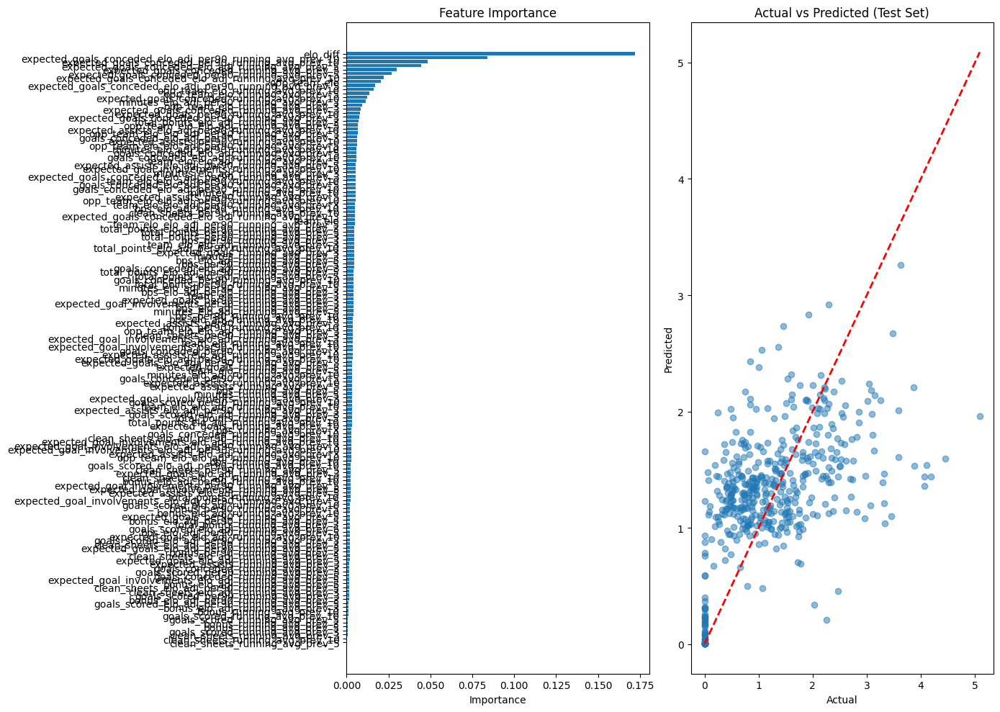

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10621/16922

Training Set Performance:
R² Score: 0.6372
RMSE: 0.5704
MAE: 0.4322

Test Set Performance:
R² Score: 0.4592
RMSE: 0.7189
MAE: 0.5379

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.254333
           expected_goals_conceded_per90_running_avg_prev_10    0.154420
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.075024
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.057251
                 expected_goals_conceded_running_avg_prev_10    0.044736
                             opp_team_elo_running_avg_prev_5    0.026290
                             opp_team_elo_running_avg_prev_3    0.022807
                                                opp_team_elo    0.021927
                            opp_team_elo_running_avg_prev_10    0.019309
                         team_

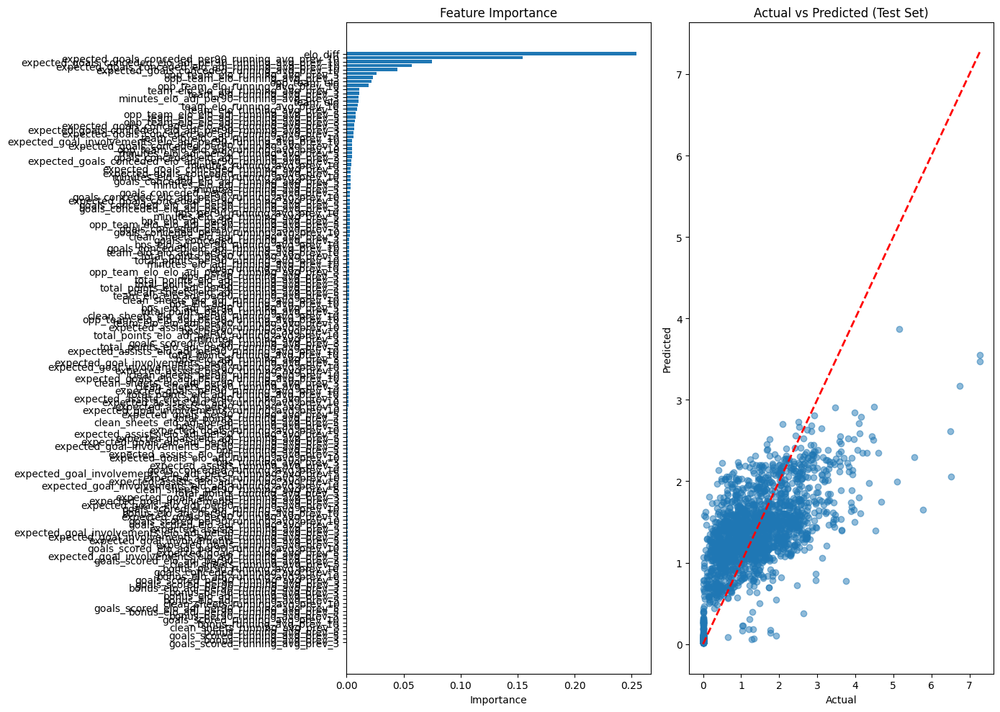

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 9122/14918

Training Set Performance:
R² Score: 0.6530
RMSE: 0.5587
MAE: 0.4205

Test Set Performance:
R² Score: 0.4417
RMSE: 0.7214
MAE: 0.5163

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.227478
           expected_goals_conceded_per90_running_avg_prev_10    0.186550
                 expected_goals_conceded_running_avg_prev_10    0.063488
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.036129
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.035671
                             opp_team_elo_running_avg_prev_5    0.023916
                            opp_team_elo_running_avg_prev_10    0.022070
                                                opp_team_elo    0.021900
                             opp_team_elo_running_avg_prev_3    0.017986
                   minutes_elo_

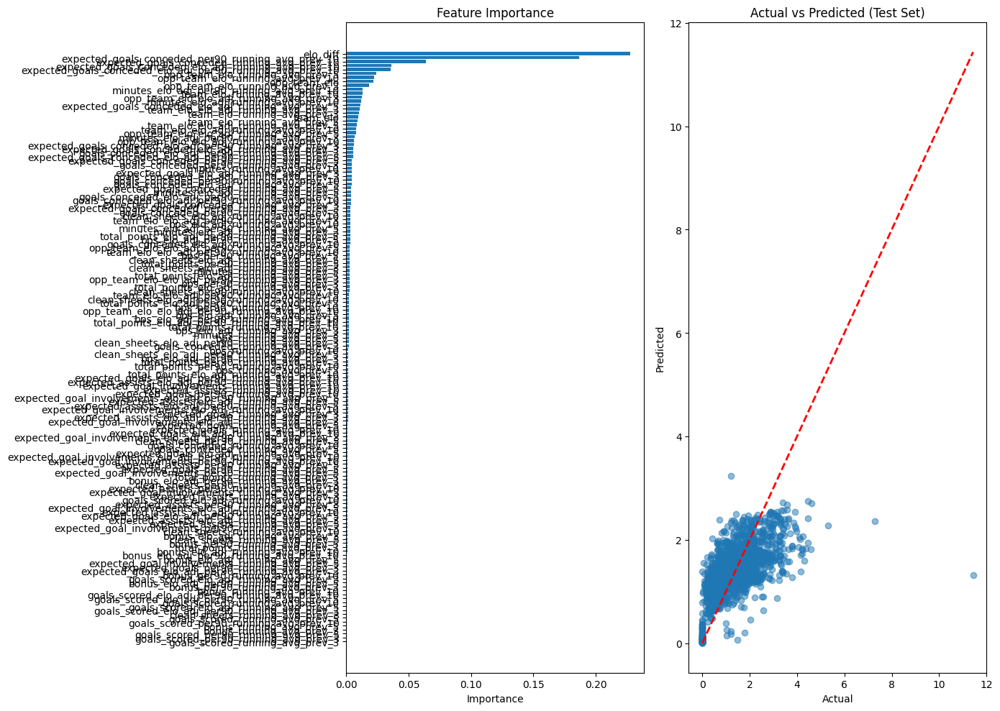

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2259/3641

Training Set Performance:
R² Score: 0.7218
RMSE: 0.4904
MAE: 0.3768

Test Set Performance:
R² Score: 0.3321
RMSE: 0.7421
MAE: 0.5635

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.217285
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.110941
           expected_goals_conceded_per90_running_avg_prev_10    0.080971
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.040363
                 expected_goals_conceded_running_avg_prev_10    0.031347
                            opp_team_elo_running_avg_prev_10    0.021620
                   goals_conceded_elo_adj_running_avg_prev_5    0.020893
                                                opp_team_elo    0.017832
                             opp_team_elo_running_avg_prev_5    0.016134
                              bps

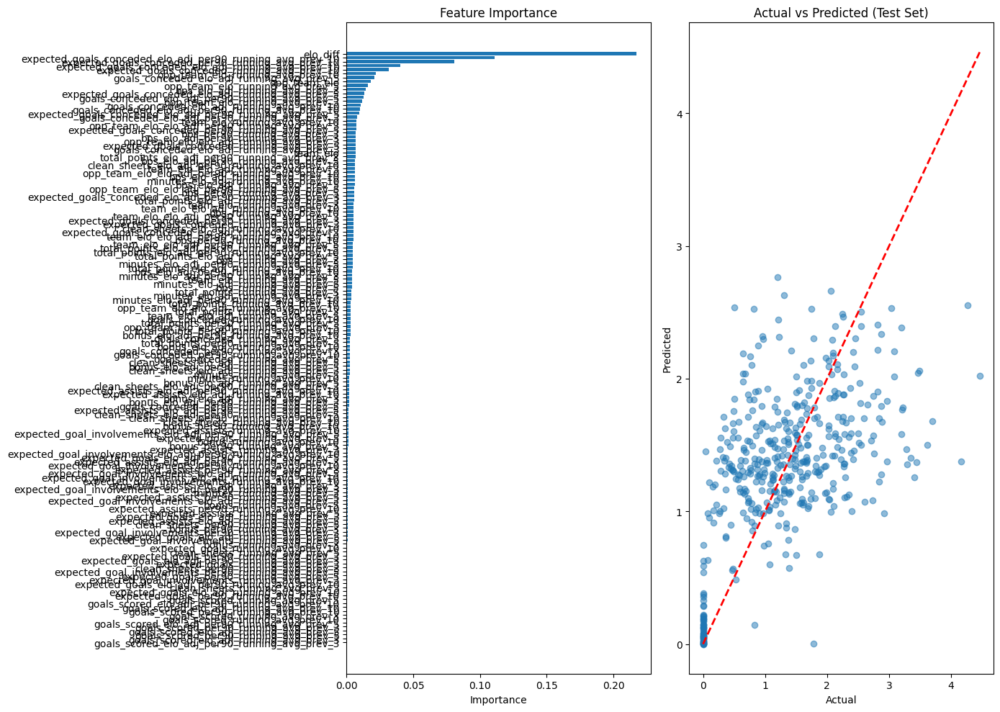

In [42]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2369/4088

Training Set Performance:
R² Score: 0.5984
RMSE: 12.3440
MAE: 10.1449

Test Set Performance:
R² Score: -0.0009
RMSE: 18.9760
MAE: 15.0809

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.057717
                                                opp_team_elo    0.027502
                            opp_team_elo_running_avg_prev_10    0.025592
                    minutes_elo_adj_per90_running_avg_prev_3    0.019589
                             opp_team_elo_running_avg_prev_3    0.019434
                             opp_team_elo_running_avg_prev_5    0.017514
                                     bps_running_avg_prev_10    0.013963
                      total_points_per90_running_avg_prev_10    0.012100
                          minutes_elo_adj_running_avg_prev_5    0.010889
                    minutes_elo_adj_per90_runni

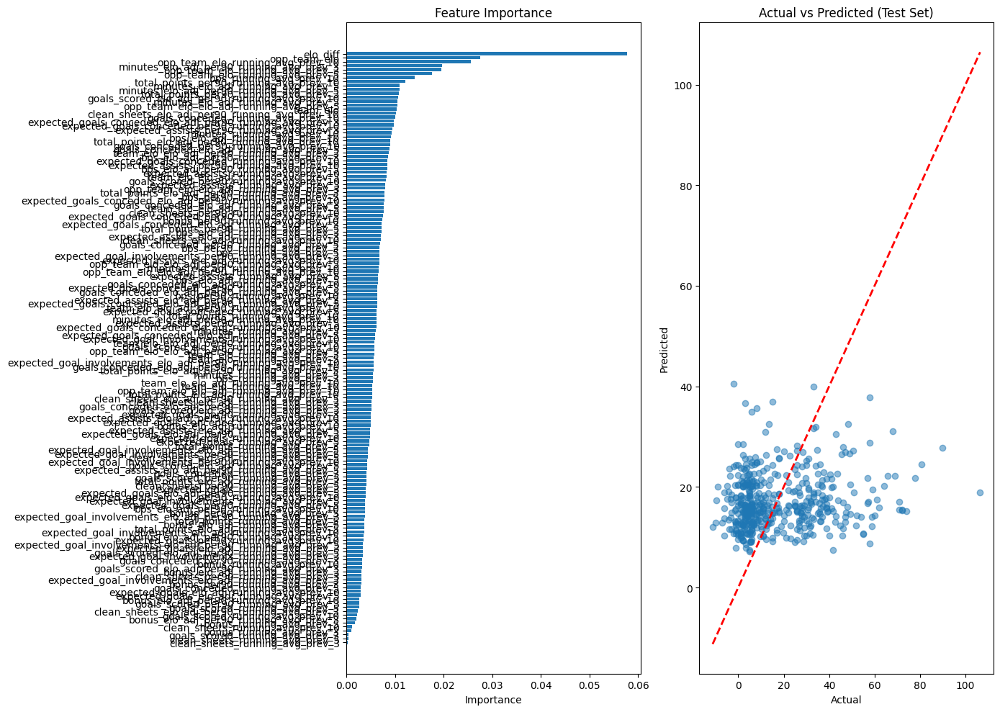

target=bps_per90, MID_bps_predictor
Cleaned df size: 10621/16922

Training Set Performance:
R² Score: 0.4048
RMSE: 8.9809
MAE: 6.9155

Test Set Performance:
R² Score: 0.0704
RMSE: 11.4467
MAE: 8.3387

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.101524
                expected_assists_elo_adj_running_avg_prev_10    0.026879
                                                opp_team_elo    0.020551
                             opp_team_elo_running_avg_prev_3    0.018913
                             opp_team_elo_running_avg_prev_5    0.018249
                            opp_team_elo_running_avg_prev_10    0.017827
                                     bps_running_avg_prev_10    0.016373
                        expected_assists_running_avg_prev_10    0.013185
                  expected_assists_per90_running_avg_prev_10    0.012461
          expected_assists_elo_adj_per90_running_

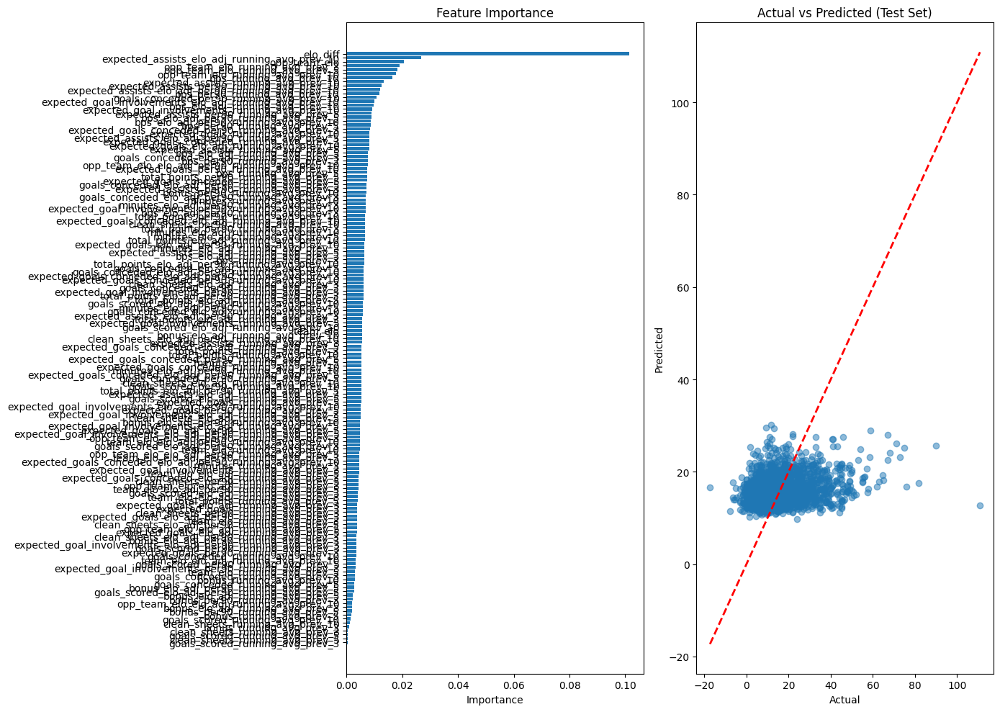

target=bps_per90, DEF_bps_predictor
Cleaned df size: 9122/14918

Training Set Performance:
R² Score: 0.4831
RMSE: 7.3078
MAE: 5.8546

Test Set Performance:
R² Score: 0.1666
RMSE: 9.2903
MAE: 7.3003

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.190367
                                                opp_team_elo    0.032657
                             opp_team_elo_running_avg_prev_5    0.023280
                               bps_per90_running_avg_prev_10    0.020350
                            opp_team_elo_running_avg_prev_10    0.019826
                             opp_team_elo_running_avg_prev_3    0.018342
                                team_elo_running_avg_prev_10    0.017525
                                                    team_elo    0.014181
                       bps_elo_adj_per90_running_avg_prev_10    0.012156
                                 team_elo_running_a

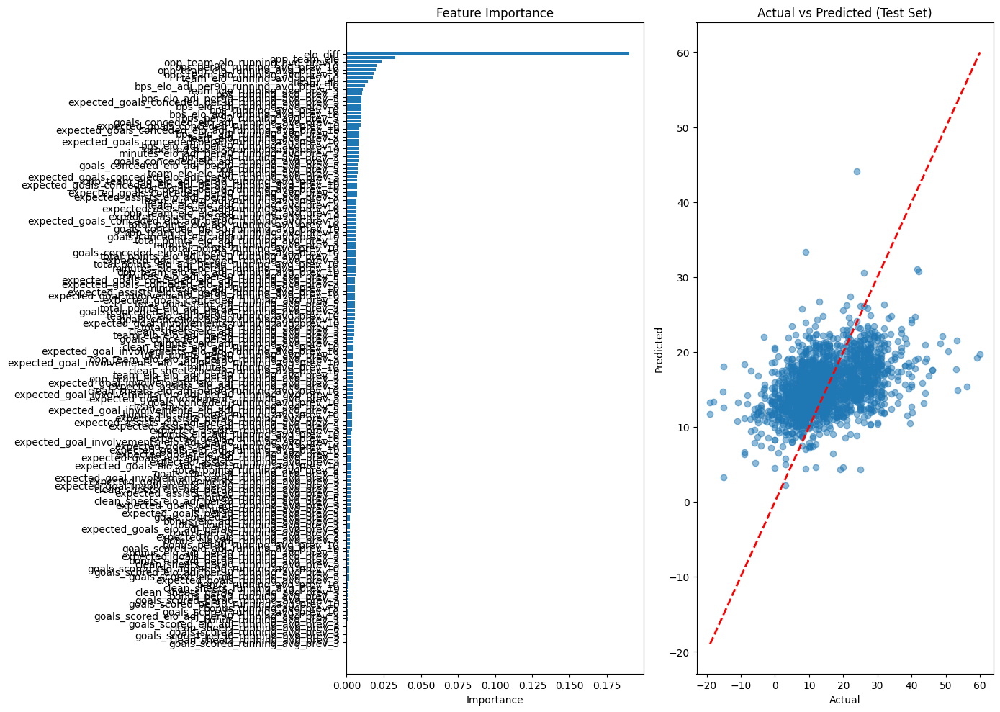

target=bps_per90, GK_bps_predictor
Cleaned df size: 2259/3641

Training Set Performance:
R² Score: 0.6416
RMSE: 5.4847
MAE: 4.4979

Test Set Performance:
R² Score: 0.0412
RMSE: 9.1425
MAE: 7.3391

Feature Importance:
                                                     feature  importance
                            opp_team_elo_running_avg_prev_10    0.040573
                                                opp_team_elo    0.032502
                                                    elo_diff    0.031776
                             opp_team_elo_running_avg_prev_3    0.031514
                             opp_team_elo_running_avg_prev_5    0.028244
                               bps_per90_running_avg_prev_10    0.026012
                                     bps_running_avg_prev_10    0.018743
                       bps_elo_adj_per90_running_avg_prev_10    0.016685
                             bps_elo_adj_running_avg_prev_10    0.016339
   expected_goals_conceded_elo_adj_per90_running_avg_

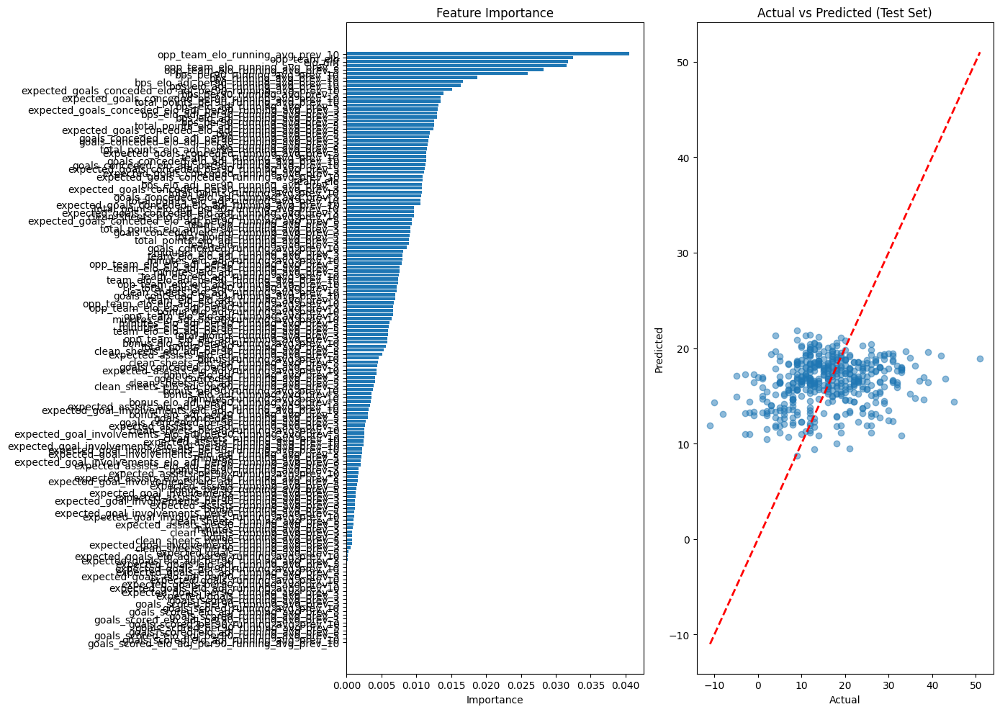

In [43]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 199/3801

Training Set Performance:
R² Score: 0.8519
RMSE: 0.6530
MAE: 0.5166

Test Set Performance:
R² Score: -0.2066
RMSE: 1.6179
MAE: 1.3354

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.107137
                                 team_elo_running_avg_prev_5    0.054909
                                team_elo_running_avg_prev_10    0.031262
                                                opp_team_elo    0.027060
                             opp_team_elo_running_avg_prev_5    0.021239
                                                    team_elo    0.020031
                            opp_team_elo_running_avg_prev_10    0.019670
                                       cbi_per90_alltime_avg    0.015052
                     bonus_elo_adj_per90_running_avg_prev_10    0.014915
                             opp_team_elo_running

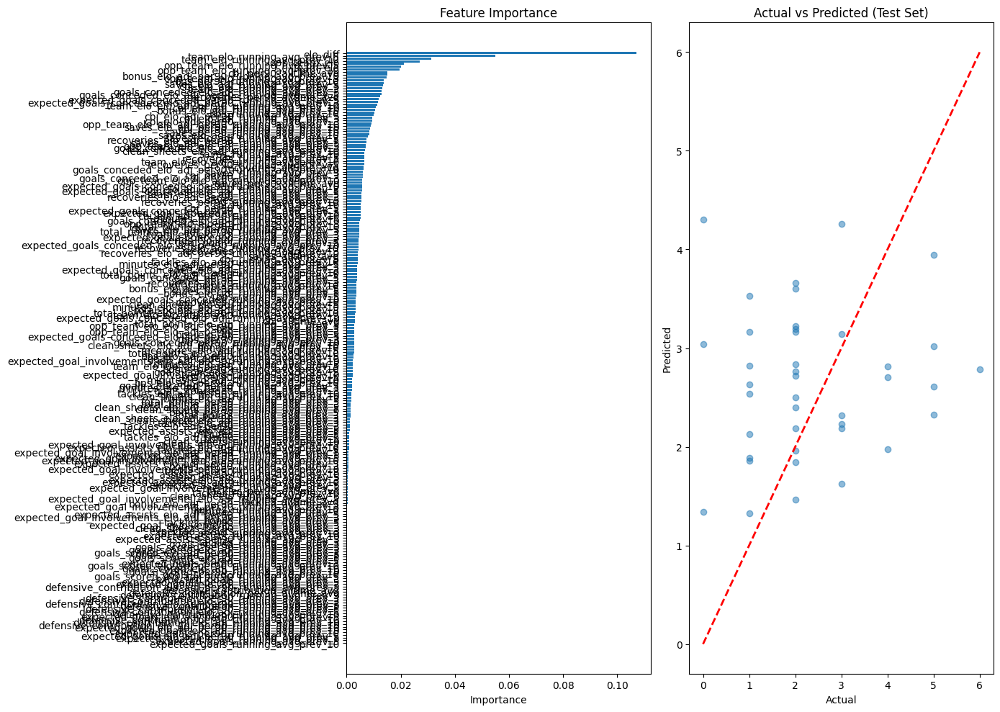

In [44]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 215/4688

Training Set Performance:
R² Score: 0.8313
RMSE: 1.0990
MAE: 0.8463

Test Set Performance:
R² Score: -0.0045
RMSE: 2.3505
MAE: 1.7610

Feature Importance:
                                                     feature  importance
                                                    team_elo    0.044397
                   defensive_contribution_running_avg_prev_3    0.025860
                  expected_goals_conceded_running_avg_prev_3    0.024745
                             opp_team_elo_running_avg_prev_5    0.023087
                            opp_team_elo_running_avg_prev_10    0.019443
                 recoveries_elo_adj_per90_running_avg_prev_5    0.014634
     defensive_contribution_elo_adj_per90_running_avg_prev_5    0.014443
                                cbi_per90_running_avg_prev_5    0.013777
                                 team_elo_running_avg_prev_5    0.013654
                         expec

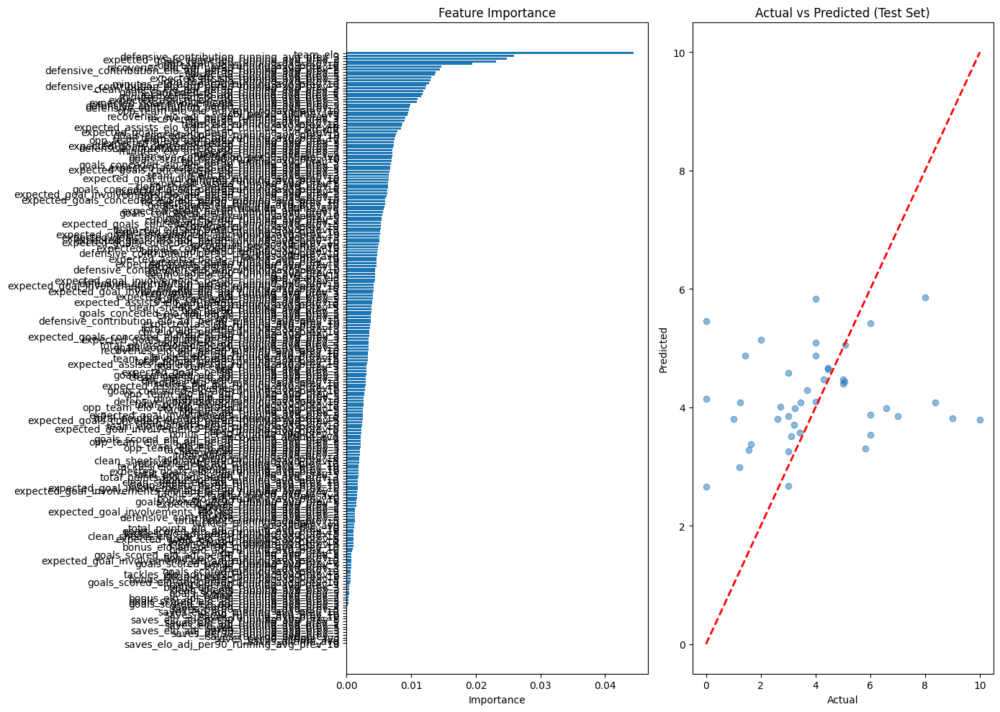

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 1043/19306

Training Set Performance:
R² Score: 0.8260
RMSE: 1.6511
MAE: 1.3327

Test Set Performance:
R² Score: 0.1652
RMSE: 3.6931
MAE: 2.8783

Feature Importance:
                                                     feature  importance
                                 tackles_running_avg_prev_10    0.030274
                                         tackles_alltime_avg    0.027539
                                                opp_team_elo    0.021714
              expected_goal_involvements_running_avg_prev_10    0.018623
        expected_goal_involvements_per90_running_avg_prev_10    0.016292
            defensive_contribution_per90_running_avg_prev_10    0.015544
                      total_points_per90_running_avg_prev_10    0.014159
                                                    elo_diff    0.013961
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.013472
                            o

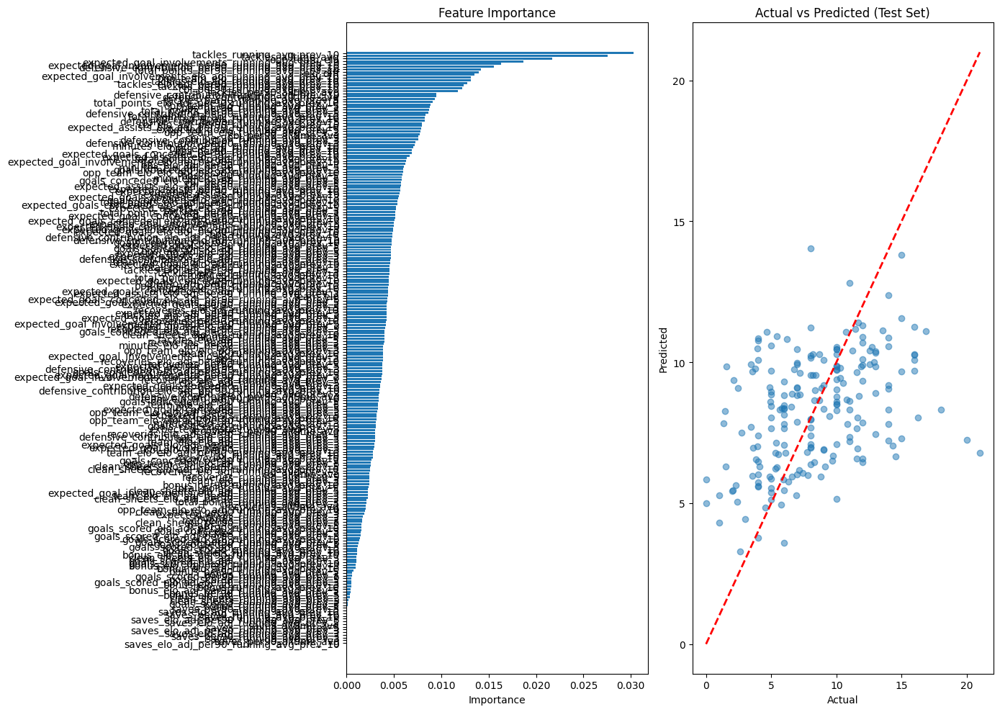

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 856/16316

Training Set Performance:
R² Score: 0.7720
RMSE: 1.8415
MAE: 1.4488

Test Set Performance:
R² Score: 0.1056
RMSE: 3.4701
MAE: 2.7013

Feature Importance:
                                                     feature  importance
                             cbi_elo_adj_running_avg_prev_10    0.032378
          expected_assists_elo_adj_per90_running_avg_prev_10    0.029230
                                                    elo_diff    0.025873
                                                opp_team_elo    0.025461
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.022902
                                             cbi_alltime_avg    0.019354
                                       cbi_per90_alltime_avg    0.017064
                             opp_team_elo_running_avg_prev_3    0.016455
                            opp_team_elo_running_avg_prev_10    0.014774
                              

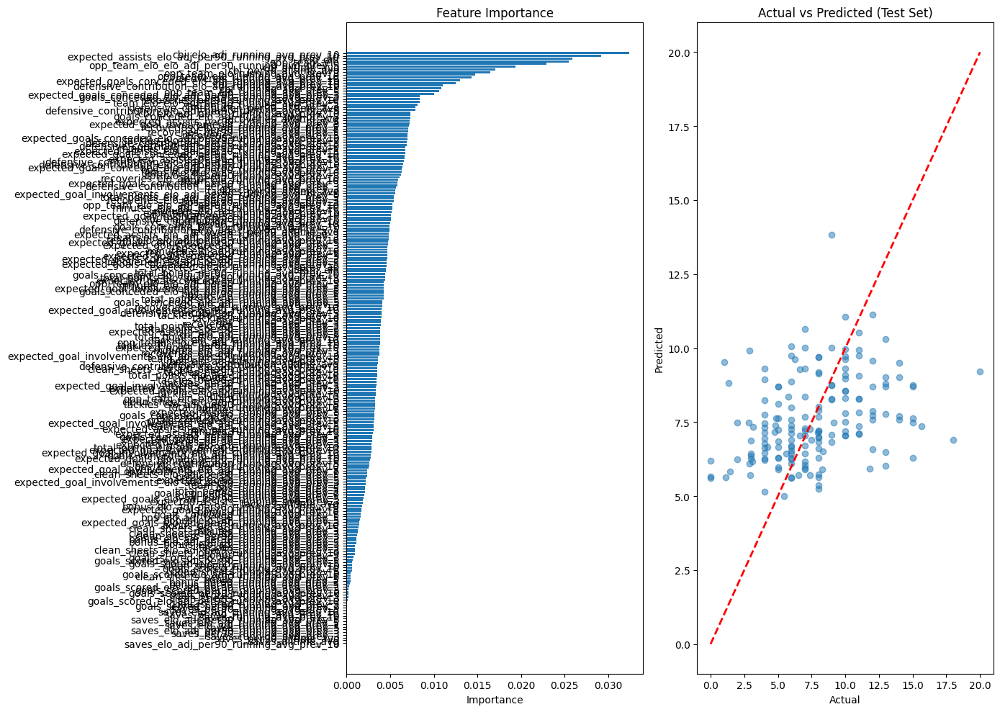

In [45]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.340


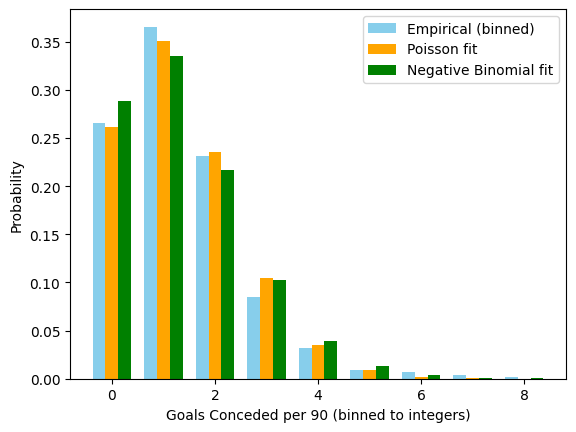

Mean: 1.332, Variance: 1.526
Overdispersion ratio (Var/Mean): 1.145
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.262


In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.210


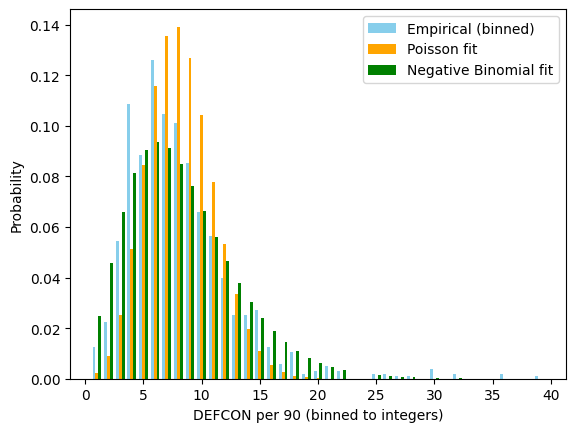

Mean: 8.205, Variance: 22.046
Overdispersion ratio (Var/Mean): 2.687
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [47]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.220


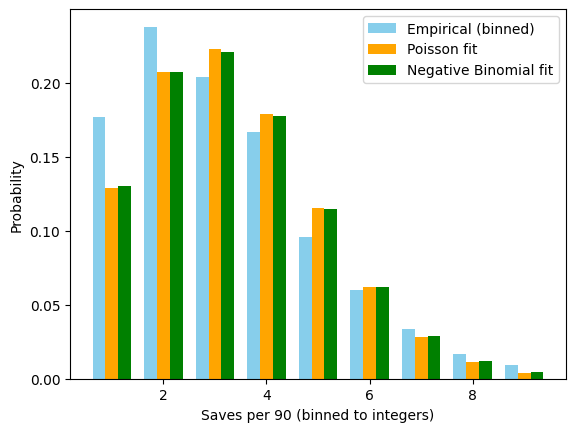

Mean: 3.220, Variance: 3.278
Overdispersion ratio (Var/Mean): 1.018
✅ Poisson assumption looks reasonable.


In [48]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.446
Model:                            OLS   Adj. R-squared (uncentered):              0.446
Method:                 Least Squares   F-statistic:                          3.176e+04
Date:                Sat, 15 Nov 2025   Prob (F-statistic):                        0.00
Time:                        18:52:17   Log-Likelihood:                         -37198.
No. Observations:               39447   AIC:                                  7.440e+04
Df Residuals:                   39446   BIC:                                  7.441e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

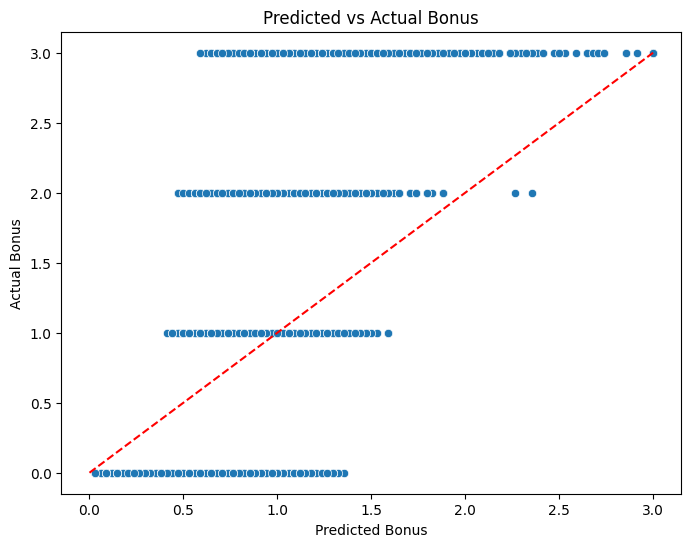

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459445  0.232496  1.110390  1.953477
FWD           0.332565  0.201122  1.049439  1.711783
GK            0.491997  0.246919  1.118971  2.014187
GKP                NaN       NaN       NaN       NaN
MID           0.393686  0.247845  1.052552  1.829328


In [49]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [50]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek+1)]

In [51]:
prediction_data.pivot_table(index='event',values='minutes',aggfunc='count')

,minutes
event,
12.0,0
13.0,0
14.0,0
15.0,0
16.0,0
17.0,0
18.0,0
19.0,0
20.0,0


In [22]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [55]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    12150.000000
mean        43.676481
std         29.594278
min          1.165068
25%         14.798824
50%         41.723028
75%         75.860210
max         87.929753
Name: mins_pred, dtype: float64

In [57]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    11367.000000
mean         0.139468
std          0.123405
min          0.009664
25%          0.048681
50%          0.094215
75%          0.188448
max          0.927339
Name: xgp90_pred, dtype: float64

In [58]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    11367.000000
mean         0.082190
std          0.048013
min          0.008683
25%          0.046173
50%          0.072947
75%          0.109820
max          0.340445
Name: xap90_pred, dtype: float64

In [59]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    12150.000000
mean         1.422084
std          0.384885
min          0.439662
25%          1.151933
50%          1.359888
75%          1.671656
max          2.586114
Name: xgcp90_pred, dtype: float64

In [60]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    12150.000000
mean        15.445577
std          3.334031
min          4.716411
25%         13.106515
50%         15.070236
75%         17.513403
max         37.088762
Name: xbpsp90_pred, dtype: float64

In [61]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    783.000000
mean       2.811123
std        0.759046
min        1.010705
25%        2.114148
50%        2.928318
75%        3.410857
max        4.309589
Name: xsavesp90_pred, dtype: float64

In [62]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    11367.000000
mean         7.602335
std          1.902482
min          2.505221
25%          6.487755
50%          7.631066
75%          8.930681
max         13.521886
Name: xdefconp90_pred, dtype: float64

In [63]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129658,Ben Winterburn,96.0,45.0,Bournemouth,MID,20252026.0,28.0,Sunderland,1041.633043,1.792579,0.331059,0.088737,1.878624
129750,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,19.0,Spurs,1013.778114,1.936133,0.351602,0.119655,2.118415
129874,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,12.0,Wolves,927.743430,48.802860,0.081684,0.168338,0.966343
129875,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,13.0,Man Utd,1056.034467,48.948472,0.071179,0.141693,1.064152
129877,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,14.0,Burnley,899.744173,48.802860,0.081580,0.168271,0.942212


In [79]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
145980,Viktor Gyökeres,666.0,89.0,Arsenal,FWD,20252026.0,12.0,Spurs,1013.778114,49.184443,0.832427,0.100547,0.851940
134291,Erling Haaland,430.0,148.0,Man City,FWD,20252026.0,12.0,Newcastle,1085.038872,69.700228,0.657246,0.064124,1.134639
139689,Liam Delap,250.0,62.0,Chelsea,FWD,20252026.0,12.0,Burnley,899.744173,32.828481,0.646924,0.153659,0.983381
137261,Jean-Philippe Mateta,283.0,80.0,Crystal Palace,FWD,20252026.0,12.0,Wolves,927.743430,78.709515,0.605461,0.083751,0.965837
138318,João Pedro Junqueira de Jesus,249.0,74.0,Chelsea,FWD,20252026.0,12.0,Burnley,899.744173,82.319301,0.568795,0.121542,0.927155
140304,Marc Guiu Paz,252.0,42.0,Chelsea,FWD,20252026.0,12.0,Burnley,899.744173,31.897151,0.560994,0.117238,0.935143
140118,Lyle Foster,217.0,50.0,Burnley,FWD,20252026.0,12.0,Chelsea,1140.722252,23.806981,0.532570,0.030235,1.884987
135766,Hugo Ekitiké,661.0,86.0,Liverpool,FWD,20252026.0,12.0,Nott'm Forest,1020.155385,51.236894,0.530402,0.069105,1.103125
136061,Igor Thiago Nascimento Rodrigues,136.0,62.0,Brentford,FWD,20252026.0,12.0,Brighton,1092.186587,78.614064,0.526601,0.054301,1.255652
138544,Junior Kroupi,100.0,46.0,Bournemouth,FWD,20252026.0,12.0,West Ham,978.277514,44.202439,0.515934,0.051756,1.079871


In [65]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [66]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [67]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_19948\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_19948\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [68]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129658,Ben Winterburn,Bournemouth,1068.336869,96.0,MID,Sunderland,1041.633043,20252026.0,45.0,28.0,...,1.878624,1,0.032969,0.005302,0.152800,0.000000,0.000000,0.488524,0.394569,2.074165
129679,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Brighton,1092.186587,20252026.0,40.0,12.0,...,1.699616,1,0.067237,0.028700,0.731015,0.000000,-0.608148,0.542889,0.395452,2.157144
129680,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Burnley,899.744173,20252026.0,40.0,13.0,...,0.740975,1,0.072893,0.039108,1.906596,0.000000,-0.177286,0.542889,0.521276,3.905477
129681,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Arsenal,1244.506645,20252026.0,40.0,14.0,...,1.892085,1,0.071689,0.029915,0.603029,0.000000,-0.701699,0.542889,0.339076,1.884900
129682,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Spurs,1013.778114,20252026.0,40.0,15.0,...,1.156452,1,0.067600,0.033957,1.258401,0.000000,-0.352969,0.542889,0.427932,2.977810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146759,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Leeds,922.657325,20252026.0,45.0,34.0,...,1.143472,2,NaN,NaN,1.274842,0.795018,-0.347130,0.000000,0.489008,4.211738
146760,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Crystal Palace,1100.561911,20252026.0,45.0,35.0,...,1.436773,2,NaN,NaN,0.950774,0.818653,-0.482509,0.000000,0.480669,3.767588
146761,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Fulham,1016.160200,20252026.0,45.0,36.0,...,1.333064,2,NaN,NaN,1.054673,0.798364,-0.433911,0.000000,0.468479,3.887606
146762,Đorđe Petrović,Bournemouth,1068.336869,67.0,GK,Man City,1229.841438,20252026.0,45.0,37.0,...,1.471159,2,NaN,NaN,0.918636,0.935512,-0.498763,0.000000,0.453091,3.808477


In [70]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
138540,Jurriën Timber,8.0,61.0,Arsenal,DEF,12.0,Spurs,1013.778114,80.409526,0.258518,0.083366,5.848362,16.476791,6.840176
141792,Mohamed Salah,381.0,142.0,Liverpool,MID,12.0,Nott'm Forest,1020.155385,82.757205,0.479291,0.190367,4.582905,18.853983,6.124465
135113,Gabriel dos Santos Magalhães,5.0,66.0,Arsenal,DEF,12.0,Spurs,1013.778114,82.620425,0.092348,0.162426,8.798108,17.853301,6.026942
134181,Enzo Fernández,237.0,67.0,Chelsea,MID,12.0,Burnley,899.744173,77.789843,0.409499,0.239045,6.693582,22.539818,5.980235
131915,Bukayo Saka,16.0,101.0,Arsenal,MID,12.0,Spurs,1013.778114,74.100477,0.358789,0.235156,8.203108,25.565622,5.833222
143795,Riccardo Calafiori,7.0,58.0,Arsenal,DEF,12.0,Spurs,1013.778114,69.996190,0.095767,0.056046,5.945642,15.553211,5.788028
140309,Marc Cucurella Saseta,224.0,61.0,Chelsea,DEF,12.0,Burnley,899.744173,82.039556,0.047578,0.118845,6.460198,23.409415,5.510159
138318,João Pedro Junqueira de Jesus,249.0,74.0,Chelsea,FWD,12.0,Burnley,899.744173,82.319301,0.568795,0.121542,3.842796,25.413760,5.414999
132453,Cody Gakpo,384.0,76.0,Liverpool,MID,12.0,Nott'm Forest,1020.155385,60.860546,0.377397,0.282027,5.939137,24.540339,5.400679
143699,Reece James,225.0,55.0,Chelsea,DEF,12.0,Burnley,899.744173,61.649963,0.060705,0.137291,7.005554,23.712583,5.370107


In [71]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    &(prediction_data['position']=='GK')
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xpoints_clean_sheets','xpoints_shots_saved','xpoints_goals_conceded','xpoints_bonus','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_bonus,xpoints
133173,Dean Henderson,253.0,50.0,Crystal Palace,GK,12.0,Wolves,927.743430,86.708125,1.501833,0.644064,-0.275046,0.475048,4.345900
143985,Robert Lynch Sánchez,220.0,48.0,Chelsea,GK,12.0,Burnley,899.744173,76.084953,1.969827,0.082910,-0.164803,0.414523,4.302457
132935,David Raya Martín,1.0,59.0,Arsenal,GK,12.0,Spurs,1013.778114,74.705693,1.818487,0.217840,-0.195815,0.405462,4.245973
134040,Emiliano Martínez Romero,32.0,50.0,Aston Villa,GK,12.0,Leeds,922.657325,87.929753,1.647534,0.342294,-0.235919,0.449809,4.203718
137897,Jordan Pickford,287.0,55.0,Everton,GK,12.0,Man Utd,1056.034467,85.150463,1.247560,0.788125,-0.356871,0.453497,4.132311
135131,Gianluigi Donnarumma,736.0,57.0,Man City,GK,12.0,Newcastle,1085.038872,87.542364,1.403569,0.481699,-0.304419,0.468144,4.048993
146665,Đorđe Petrović,67.0,45.0,Bournemouth,GK,12.0,West Ham,978.277514,86.399843,1.189098,0.768255,-0.378642,0.462663,4.041372
135222,Giorgi Mamardashvili,367.0,43.0,Liverpool,GK,12.0,Nott'm Forest,1020.155385,77.642169,1.384573,0.360068,-0.310405,0.406377,3.840613
144025,Robin Roefs,670.0,47.0,Sunderland,GK,12.0,Fulham,1016.160200,87.507707,1.157168,0.491594,-0.391081,0.551735,3.809417
130204,Alphonse Areola,600.0,43.0,West Ham,GK,12.0,Bournemouth,1068.336869,79.208898,0.918453,0.910644,-0.498858,0.439362,3.769601


In [72]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12150 entries, 0 to 12149
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          12150 non-null  object 
 1   team_name               12150 non-null  object 
 2   team_elo                12150 non-null  float64
 3   element                 12150 non-null  float64
 4   position                12150 non-null  object 
 5   opp_team_name           12150 non-null  object 
 6   opp_team_elo            12150 non-null  float64
 7   season                  12150 non-null  float64
 8   value                   12150 non-null  float64
 9   event                   12150 non-null  float64
 10  mins_pred               12150 non-null  float64
 11  xgp90_pred              11367 non-null  float64
 12  xap90_pred              11367 non-null  float64
 13  xgcp90_pred             12150 non-null  float64
 14  xpoints_mins            12150 non-null

In [73]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [74]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [75]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 12 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
138540,Jurriën Timber,8.0,12.0,61.0,Arsenal,DEF,Spurs,1013.778114,80.409526,2,1.385821,0.223446,2.311312,0.0,-0.107711,0.542889,0.484418,6.840176
141792,Mohamed Salah,381.0,12.0,142.0,Liverpool,MID,Nott'm Forest,1020.155385,82.757205,2,2.203599,0.525142,0.352893,0.0,0.000000,0.488524,0.554307,6.124465
135113,Gabriel dos Santos Magalhães,5.0,12.0,66.0,Arsenal,DEF,Spurs,1013.778114,82.620425,2,0.508657,0.447323,2.137846,0.0,-0.134660,0.542889,0.524887,6.026942
134181,Enzo Fernández,237.0,12.0,67.0,Chelsea,MID,Burnley,899.744173,77.789843,2,1.769716,0.619843,0.439481,0.0,0.000000,0.488524,0.662671,5.980235
131915,Bukayo Saka,16.0,12.0,101.0,Arsenal,MID,Spurs,1013.778114,74.100477,2,1.477025,0.580839,0.535204,0.0,0.000000,0.488524,0.751629,5.833222
143795,Riccardo Calafiori,7.0,12.0,58.0,Arsenal,DEF,Spurs,1013.778114,69.996190,2,0.446888,0.130767,2.317099,0.0,-0.106879,0.542889,0.457264,5.788028
140309,Marc Cucurella Saseta,224.0,12.0,61.0,Chelsea,DEF,Burnley,899.744173,82.039556,2,0.260216,0.324999,1.877146,0.0,-0.183328,0.542889,0.688237,5.510159
138318,João Pedro Junqueira de Jesus,249.0,12.0,74.0,Chelsea,FWD,Burnley,899.744173,82.319301,2,2.081015,0.333510,0.000000,0.0,0.000000,0.253309,0.747165,5.414999
132453,Cody Gakpo,384.0,12.0,76.0,Liverpool,MID,Nott'm Forest,1020.155385,60.860546,2,1.276031,0.572143,0.342494,0.0,0.000000,0.488524,0.721486,5.400679
143699,Reece James,225.0,12.0,55.0,Chelsea,DEF,Burnley,899.744173,61.649963,2,0.249495,0.282132,1.798624,0.0,-0.200184,0.542889,0.697150,5.370107


In [76]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW11 - GW16


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
317,Mohamed Salah,413.852175,10,11.012637,2.687088,1.841776,0.0,0.000000,2.442622,2.973561,30.957683
234,Jurriën Timber,398.868787,10,6.854654,1.011701,8.821815,0.0,-1.181788,2.714445,2.467231,30.688059
57,Bukayo Saka,369.522644,10,6.996769,2.924794,2.132695,0.0,0.000000,2.442622,3.628689,28.125569
118,Enzo Fernández,389.272826,10,7.859215,2.707180,1.653706,0.0,0.000000,2.442622,3.005896,27.668619
73,Cody Gakpo,306.966515,10,6.680567,2.831019,1.864068,0.0,0.000000,2.442622,3.758540,27.576816
142,Gabriel dos Santos Magalhães,410.264085,10,2.557430,2.253025,8.088622,0.0,-1.344432,2.714445,2.771997,27.041087
120,Erling Haaland,344.073667,10,11.430701,0.733446,0.000000,0.0,0.000000,1.266546,3.449322,26.880016
56,Bryan Mbeumo,419.911927,10,6.843900,2.834302,1.380376,0.0,0.000000,2.442622,2.926698,26.427898
81,Dan Burn,339.753001,10,6.301917,1.296641,5.274344,0.0,-2.233187,2.714445,2.321124,25.675286
371,Riccardo Calafiori,348.264206,10,2.239117,0.613694,8.712838,0.0,-1.202875,2.714445,2.476303,25.553523


In [77]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
317,Mohamed Salah,2234.889726,54,58.837030,13.761305,9.201611,0.0,0.000000,13.190159,15.562419,164.552523
234,Jurriën Timber,2158.114629,54,37.038949,5.312068,44.965928,0.0,-6.981706,14.658004,12.747551,161.740795
57,Bukayo Saka,1990.238045,54,37.202010,15.987539,10.903093,0.0,0.000000,13.190159,19.540006,150.822807
118,Enzo Fernández,2102.322869,54,40.603397,14.371811,7.720653,0.0,0.000000,13.190159,15.718287,145.604307
73,Cody Gakpo,1656.620736,54,35.208108,14.253918,9.364105,0.0,0.000000,13.190159,19.442109,145.458400
120,Erling Haaland,1859.046032,54,58.915946,4.006585,0.000000,0.0,0.000000,6.839350,18.577945,142.339826
142,Gabriel dos Santos Magalhães,2217.282976,54,13.952848,12.055792,41.194064,0.0,-7.924798,14.658004,14.338007,142.273917
56,Bryan Mbeumo,2266.966598,54,36.298370,14.909429,6.846703,0.0,0.000000,13.190159,15.302304,140.546965
199,Jean-Philippe Mateta,2143.741146,54,53.086951,5.879430,0.000000,0.0,0.000000,6.839350,16.969570,136.775301
256,Leandro Trossard,2102.841953,54,29.321555,14.104501,10.837912,0.0,0.000000,13.190159,15.314284,136.768410


In [ ]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 23.4 minute(s)

Finished in 23.41 minute(s)
